In [2]:
import networkx as nx
import random
import numpy as np
import itertools
import re
from collections import Counter
import seaborn as sns
import pickle 
import pandas as pd
import matplotlib.pyplot as plt
from upsetplot import from_memberships, UpSet

In [54]:
stage_labels = ['L1-0', 'L1-5', 'L1-8', 'L1-16', 'L2', 'L3', 'Ad-45-1', 'Ad-45-2']

In [159]:
stage_labels_plot = ['L1$_{0h}$', 'L1$_{5h}$', 'L1$_{8h}$', 'L1$_{16h}$', 'L2', 'L3', 'Ad$^{1}$', 'Ad$^{2}$']

In [58]:
with open('all_c_elegans_weighted_graphs.pkl', 'rb') as file:
    all_c_elegans_weighted_graphs = pickle.load(file)

In [60]:
with open("data/processed/C_elegans_rich_clubs_in_degree_all_stages.pkl", "rb") as f:
    rich_clubs_in_degree = pickle.load(f)
    
with open("data/processed/C_elegans_rich_clubs_out_degree_all_stages.pkl", "rb") as f:
    rich_clubs_out_degree = pickle.load(f)

In [62]:
with open("data/processed/C_elegans_rich_clubs_weighted_in_degree_all_stages.pkl", "rb") as f:
    rich_clubs_weighted_in_degree = pickle.load(f)
    
with open("data/processed/C_elegans_rich_clubs_weighted_out_degree_all_stages.pkl", "rb") as f:
    rich_clubs_weighted_out_degree = pickle.load(f)

In [64]:
with open('data/processed/C_elegans_kin_k_cores_across_stages.pkl', 'rb') as file:
    kin_k_cores_across_stages = pickle.load(file)
    
with open('data/processed/C_elegans_kout_k_cores_across_stages.pkl', 'rb') as file:
    kout_k_cores_across_stages = pickle.load(file)
    
with open('data/processed/C_elegans_kin_s_cores_across_stages.pkl', 'rb') as file:
    kin_s_cores_across_stages = pickle.load(file)
    
with open('data/processed/C_elegans_kout_s_cores_across_stages.pkl', 'rb') as file:
    kout_s_cores_across_stages = pickle.load(file)

**Warnings I get from UpSet plot execution**
1. Downcasting warning (fillna)
   
_FutureWarning: Downcasting object dtype arrays on .fillna ..._


upsetplot fills missing values in an object-dtype DataFrame
Pandas currently converts it to boolean automatically
Pandas warns this implicit conversion will be disallowed in 3.0
Meaning: works correctly now; library needs updating later.

2. Chained assignment warnings (inplace=True)
   
_FutureWarning: A value is trying to be set on a copy ..._


upsetplot modifies temporary Series objects using inplace=True
This pattern will stop working in pandas 3.0
Meaning: styling is applied correctly now; future-proofing issue in the library.

3. tight_layout warning
   
_UserWarning: Axes not compatible with tight_layout_

UpSet uses multiple linked axes
tight_layout() can’t handle this reliably
Meaning: layout may be imperfect; use constrained_layout instead.

In [79]:
import warnings

# FutureWarning triggered inside upsetplot (pandas downcasting + chained assignment)
warnings.filterwarnings("ignore", category=FutureWarning, module=r"upsetplot\..*")

# Tight-layout warning from matplotlib with multi-axes layouts used by upsetplot
warnings.filterwarnings("ignore", category=UserWarning, message=r".*not compatible with tight_layout.*")


In [189]:
import matplotlib as mpl

mpl.rcParams.update({
    "font.size": 14,          # base font
    "axes.titlesize": 16,
    "axes.labelsize": 18,
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,
})


In [258]:
def return_sets_across_dev(stage_idx):
    
    sets_across_stages = {
    # Cores
    r"$Core: k_{in}$" : set(kin_k_cores_across_stages[stage_idx]),
    r"$Core: k_{out}$": set(kout_k_cores_across_stages[stage_idx]),
    r"$Core: s_{in}$" : set(kin_s_cores_across_stages[stage_idx]),
    r"$Core: s_{out}$": set(kout_s_cores_across_stages[stage_idx]),

    # Rich-clubs
    r"$RC: k_{in}$"   : set(rich_clubs_in_degree[stage_idx]),
    r"$RC: k_{out}$"  : set(rich_clubs_out_degree[stage_idx]),
    r"$RC: s_{in}$"   : set(rich_clubs_weighted_in_degree[stage_idx]),
    r"$RC: s_{out}$"  : set(rich_clubs_weighted_out_degree[stage_idx]),
    }

    return sets_across_stages

**There's no way to increase the spacing between the columns of an Upset plot such that those datasets having fewer cols end up with the same figure size and fontsize as those with more cols. I wanted to do this to achieve a cleaner figure but sadly, it's not possible. I tried element_size but that doesn't help. It's only possible to pad empty columns on the right but that doesn't help my cause**

### $L1_{0h}$

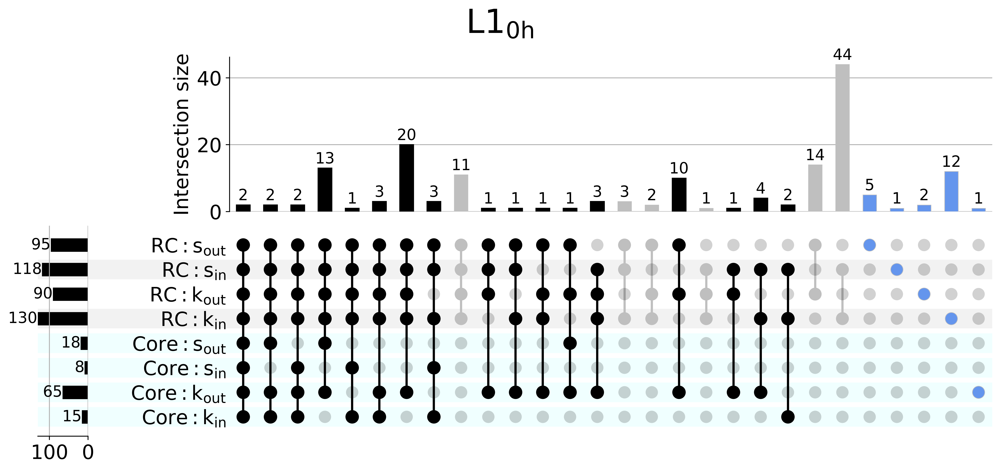

In [325]:
import matplotlib.pyplot as plt
from upsetplot import from_memberships, UpSet

stage = 0
sets_across_stages = return_sets_across_dev(stage)

all_nodes = set().union(*sets_across_stages.values())

memberships = []
for node in all_nodes:
    memberships.append([name for name, s in sets_across_stages.items() if node in s])

data = from_memberships(memberships)

fig = plt.figure(figsize=(10, 6), dpi=500)

up = UpSet(
    data,
    subset_size="count",
    show_counts=True,
    sort_by="-degree",
    sort_categories_by=None,
    min_subset_size=1 # shows ALL subsets0
)

RC = [r"$RC: k_{in}$", r"$RC: k_{out}$", r"$RC: s_{in}$", r"$RC: s_{out}$"]
CORE = [r"$Core: k_{in}$", r"$Core: k_{out}$", r"$Core: s_{in}$", r"$Core: s_{out}$"]

up.style_categories(categories=CORE, shading_facecolor="azure") # increasing the separation between Core and RC section

# De-emphasize RC-only intersections
up.style_subsets(absent=CORE, facecolor="0.75", edgecolor="0.75", linewidth=0.5)
# De-emphasize Core-only intersections
up.style_subsets(absent=RC, facecolor="0.75", edgecolor="0.75", linewidth=0.5)

up.style_subsets(min_degree=1, max_degree=1, facecolor="cornflowerblue") # segregating the unique subsets

up.plot(fig=fig)
fig.suptitle(stage_labels_plot[stage], fontsize=30)

plt.show()



In [327]:
import matplotlib.pyplot as plt
from upsetplot import from_memberships, UpSet

stage = 0
sets_across_stages = return_sets_across_dev(stage)

all_nodes = set().union(*sets_across_stages.values())

memberships = []
for node in all_nodes:
    memberships.append([name for name, s in sets_across_stages.items() if node in s])

data = from_memberships(memberships)

fig = plt.figure(figsize=(10, 6), dpi=500)

up = UpSet(
    data,
    subset_size="count",
    show_counts=True,
    sort_by="-degree",
    sort_categories_by=None,
    min_subset_size=1, # shows ALL subsets
    element_size=100
)

RC = [r"$RC: k_{in}$", r"$RC: k_{out}$", r"$RC: s_{in}$", r"$RC: s_{out}$"]
CORE = [r"$Core: k_{in}$", r"$Core: k_{out}$", r"$Core: s_{in}$", r"$Core: s_{out}$"]

up.style_categories(categories=CORE, shading_facecolor="azure") # increasing the separation between Core and RC section

# De-emphasize RC-only intersections
up.style_subsets(absent=CORE, facecolor="0.75", edgecolor="0.75", linewidth=0.5)
# De-emphasize Core-only intersections
up.style_subsets(absent=RC, facecolor="0.75", edgecolor="0.75", linewidth=0.5)

up.style_subsets(min_degree=1, max_degree=1, facecolor="cornflowerblue") # segregating the unique subsets

up.plot(fig=fig)
fig.suptitle(stage_labels_plot[stage], fontsize=30)

plt.show()



### $L1_{5h}$

In [309]:
stage = 1
sets_across_stages = return_sets_across_dev(stage)

all_nodes = set().union(*sets_across_stages.values())

memberships = []
for node in all_nodes:
    memberships.append([name for name, s in sets_across_stages.items() if node in s])

data = from_memberships(memberships)

fig = plt.figure(figsize=(10, 6), dpi=500)

up = UpSet(
    data,
    subset_size="count",
    show_counts=True,
    sort_by="-degree",
    sort_categories_by=None,
    min_subset_size=1, # shows ALL subsets
    element_size=100
)

RC = [r"$RC: k_{in}$", r"$RC: k_{out}$", r"$RC: s_{in}$", r"$RC: s_{out}$"]
CORE = [r"$Core: k_{in}$", r"$Core: k_{out}$", r"$Core: s_{in}$", r"$Core: s_{out}$"]

up.style_categories(categories=CORE, shading_facecolor="azure") # increasing the separation between Core and RC section

# De-emphasize RC-only intersections
up.style_subsets(absent=CORE, facecolor="0.75", edgecolor="0.75", linewidth=0.5)
# De-emphasize Core-only intersections
up.style_subsets(absent=RC, facecolor="0.75", edgecolor="0.75", linewidth=0.5)

up.style_subsets(min_degree=1, max_degree=1, facecolor="cornflowerblue") # segregating the unique subsets

up.plot(fig=fig)
fig.suptitle(stage_labels_plot[stage], fontsize=30)

plt.show()

### $L1_{8h}$

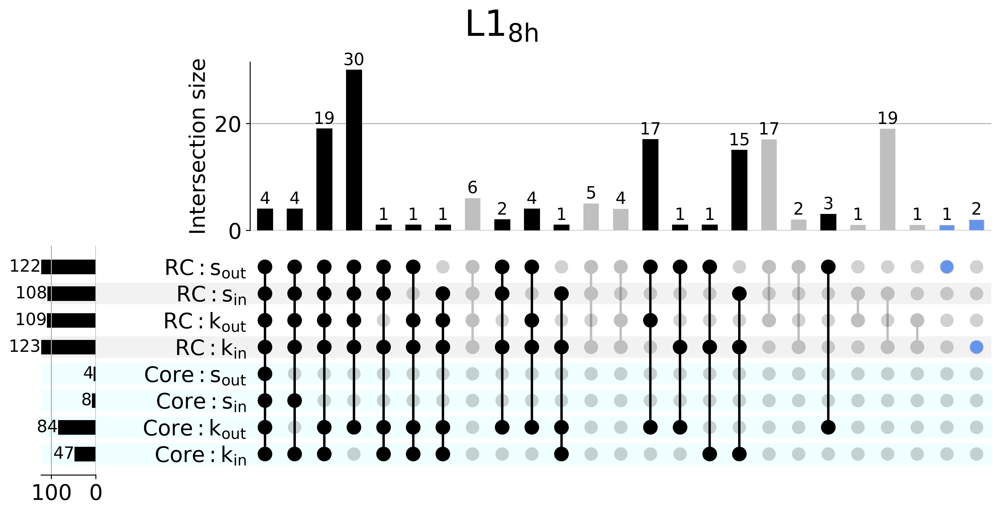

In [265]:
stage = 2
sets_across_stages = return_sets_across_dev(stage)

all_nodes = set().union(*sets_across_stages.values())

memberships = []
for node in all_nodes:
    memberships.append([name for name, s in sets_across_stages.items() if node in s])

data = from_memberships(memberships)

fig = plt.figure(figsize=(10, 6), dpi=500)

up = UpSet(
    data,
    subset_size="count",
    show_counts=True,
    sort_by="-degree",
    sort_categories_by=None,
    min_subset_size=1 # shows ALL subsets
)

RC = [r"$RC: k_{in}$", r"$RC: k_{out}$", r"$RC: s_{in}$", r"$RC: s_{out}$"]
CORE = [r"$Core: k_{in}$", r"$Core: k_{out}$", r"$Core: s_{in}$", r"$Core: s_{out}$"]

up.style_categories(categories=CORE, shading_facecolor="azure") # increasing the separation between Core and RC section

# De-emphasize RC-only intersections
up.style_subsets(absent=CORE, facecolor="0.75", edgecolor="0.75", linewidth=0.5)
# De-emphasize Core-only intersections
up.style_subsets(absent=RC, facecolor="0.75", edgecolor="0.75", linewidth=0.5)

up.style_subsets(min_degree=1, max_degree=1, facecolor="cornflowerblue") # segregating the unique subsets

up.plot(fig=fig)
fig.suptitle(stage_labels_plot[stage], fontsize=30)

plt.show()

### $L1_{16h}$

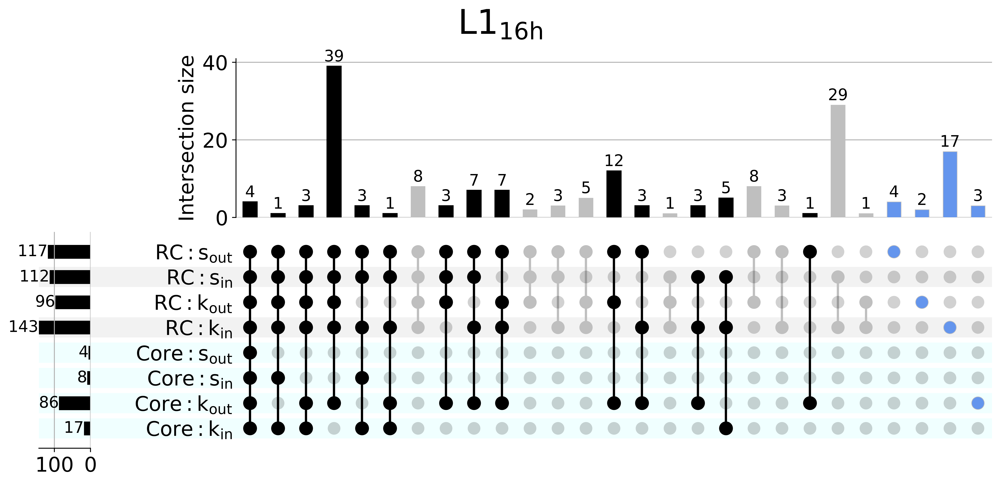

In [279]:
stage = 3
sets_across_stages = return_sets_across_dev(stage)

all_nodes = set().union(*sets_across_stages.values())

memberships = []
for node in all_nodes:
    memberships.append([name for name, s in sets_across_stages.items() if node in s])

data = from_memberships(memberships)

fig = plt.figure(figsize=(10, 6), dpi=500)

up = UpSet(
    data,
    subset_size="count",
    show_counts=True,
    sort_by="-degree",
    sort_categories_by=None,
    min_subset_size=1 # shows ALL subsets
)

RC = [r"$RC: k_{in}$", r"$RC: k_{out}$", r"$RC: s_{in}$", r"$RC: s_{out}$"]
CORE = [r"$Core: k_{in}$", r"$Core: k_{out}$", r"$Core: s_{in}$", r"$Core: s_{out}$"]

up.style_categories(categories=CORE, shading_facecolor="azure") # increasing the separation between Core and RC section

# De-emphasize RC-only intersections
up.style_subsets(absent=CORE, facecolor="0.75", edgecolor="0.75", linewidth=0.5)
# De-emphasize Core-only intersections
up.style_subsets(absent=RC, facecolor="0.75", edgecolor="0.75", linewidth=0.5)

up.style_subsets(min_degree=1, max_degree=1, facecolor="cornflowerblue") # segregating the unique subsets

up.plot(fig=fig)
fig.suptitle(stage_labels_plot[stage], fontsize=30)

plt.show()

### $L2$

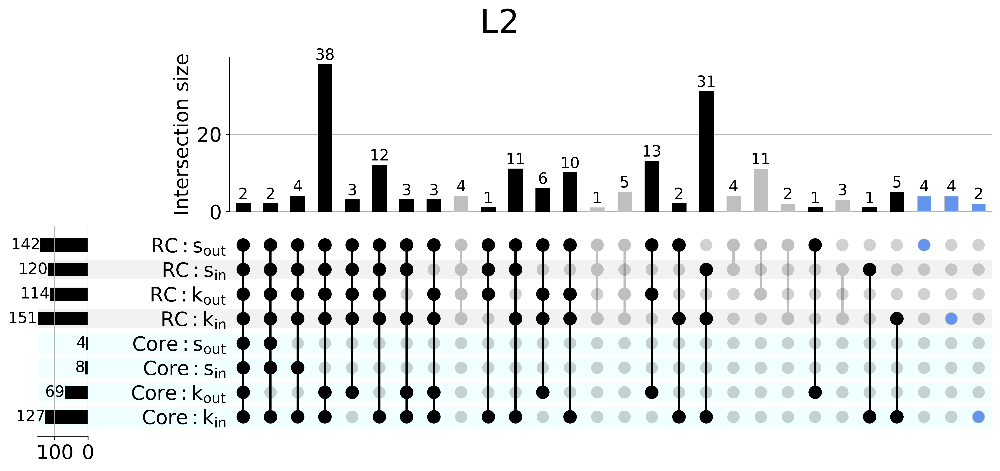

In [269]:
stage = 4
sets_across_stages = return_sets_across_dev(stage)

all_nodes = set().union(*sets_across_stages.values())

memberships = []
for node in all_nodes:
    memberships.append([name for name, s in sets_across_stages.items() if node in s])

data = from_memberships(memberships)

fig = plt.figure(figsize=(10, 6), dpi=500)

up = UpSet(
    data,
    subset_size="count",
    show_counts=True,
    sort_by="-degree",
    sort_categories_by=None,
    min_subset_size=1 # shows ALL subsets
)

RC = [r"$RC: k_{in}$", r"$RC: k_{out}$", r"$RC: s_{in}$", r"$RC: s_{out}$"]
CORE = [r"$Core: k_{in}$", r"$Core: k_{out}$", r"$Core: s_{in}$", r"$Core: s_{out}$"]

up.style_categories(categories=CORE, shading_facecolor="azure") # increasing the separation between Core and RC section

# De-emphasize RC-only intersections
up.style_subsets(absent=CORE, facecolor="0.75", edgecolor="0.75", linewidth=0.5)
# De-emphasize Core-only intersections
up.style_subsets(absent=RC, facecolor="0.75", edgecolor="0.75", linewidth=0.5)

up.style_subsets(min_degree=1, max_degree=1, facecolor="cornflowerblue") # segregating the unique subsets

up.plot(fig=fig)
fig.suptitle(stage_labels_plot[stage], fontsize=30)

plt.show()

### $L3$

In [311]:
stage = 5
sets_across_stages = return_sets_across_dev(stage)

all_nodes = set().union(*sets_across_stages.values())

memberships = []
for node in all_nodes:
    memberships.append([name for name, s in sets_across_stages.items() if node in s])

data = from_memberships(memberships)

fig = plt.figure(figsize=(10, 6), dpi=500)

up = UpSet(
    data,
    subset_size="count",
    show_counts=True,
    sort_by="-degree",
    sort_categories_by=None,
    min_subset_size=1, # shows ALL subsets
    element_size=100
)

RC = [r"$RC: k_{in}$", r"$RC: k_{out}$", r"$RC: s_{in}$", r"$RC: s_{out}$"]
CORE = [r"$Core: k_{in}$", r"$Core: k_{out}$", r"$Core: s_{in}$", r"$Core: s_{out}$"]

up.style_categories(categories=CORE, shading_facecolor="azure") # increasing the separation between Core and RC section

# De-emphasize RC-only intersections
up.style_subsets(absent=CORE, facecolor="0.75", edgecolor="0.75", linewidth=0.5)
# De-emphasize Core-only intersections
up.style_subsets(absent=RC, facecolor="0.75", edgecolor="0.75", linewidth=0.5)

up.style_subsets(min_degree=1, max_degree=1, facecolor="cornflowerblue") # segregating the unique subsets

up.plot(fig=fig)
fig.suptitle(stage_labels_plot[stage], fontsize=30)

plt.show()

### $Ad^1$

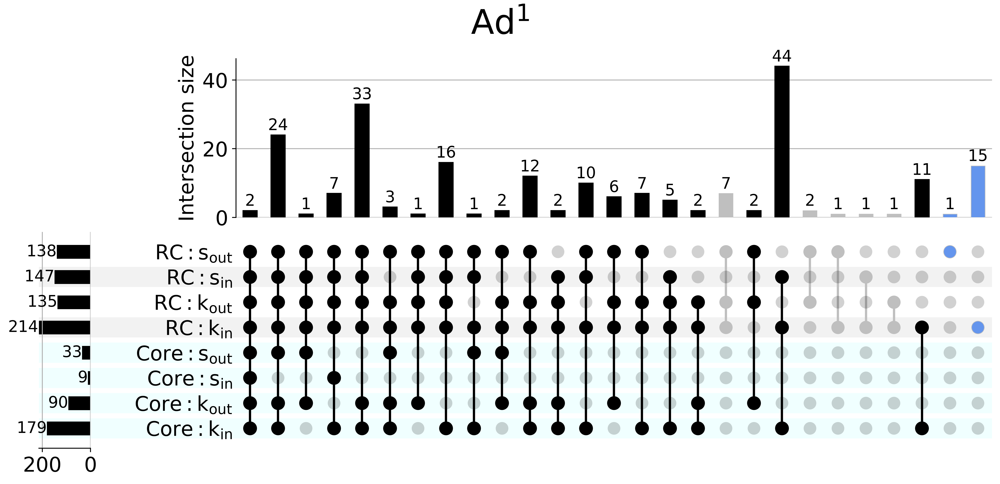

In [273]:
stage = 6
sets_across_stages = return_sets_across_dev(stage)

all_nodes = set().union(*sets_across_stages.values())

memberships = []
for node in all_nodes:
    memberships.append([name for name, s in sets_across_stages.items() if node in s])

data = from_memberships(memberships)

fig = plt.figure(figsize=(10, 6), dpi=500)

up = UpSet(
    data,
    subset_size="count",
    show_counts=True,
    sort_by="-degree",
    sort_categories_by=None,
    min_subset_size=1 # shows ALL subsets
)

RC = [r"$RC: k_{in}$", r"$RC: k_{out}$", r"$RC: s_{in}$", r"$RC: s_{out}$"]
CORE = [r"$Core: k_{in}$", r"$Core: k_{out}$", r"$Core: s_{in}$", r"$Core: s_{out}$"]

up.style_categories(categories=CORE, shading_facecolor="azure") # increasing the separation between Core and RC section

# De-emphasize RC-only intersections
up.style_subsets(absent=CORE, facecolor="0.75", edgecolor="0.75", linewidth=0.5)
# De-emphasize Core-only intersections
up.style_subsets(absent=RC, facecolor="0.75", edgecolor="0.75", linewidth=0.5)

up.style_subsets(min_degree=1, max_degree=1, facecolor="cornflowerblue") # segregating the unique subsets

up.plot(fig=fig)
fig.suptitle(stage_labels_plot[stage], fontsize=30)

plt.show()

### $Ad^2$

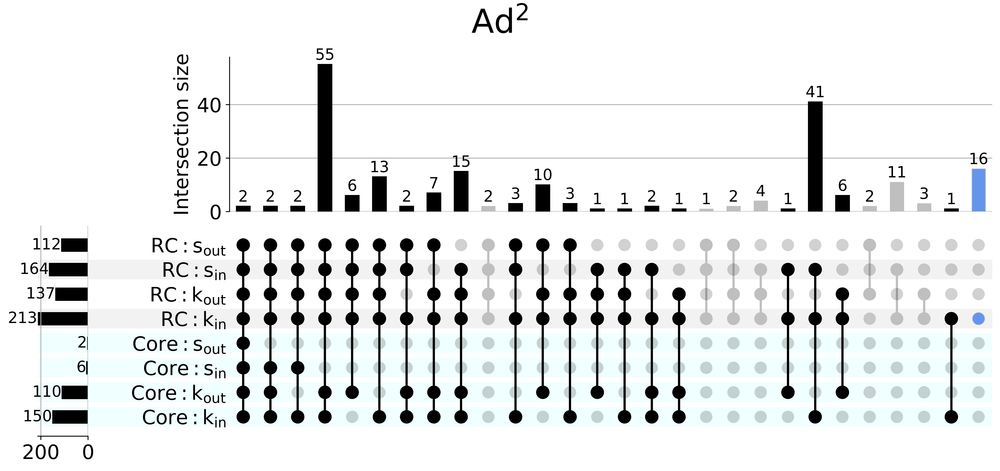

In [275]:
stage = 7
sets_across_stages = return_sets_across_dev(stage)

all_nodes = set().union(*sets_across_stages.values())

memberships = []
for node in all_nodes:
    memberships.append([name for name, s in sets_across_stages.items() if node in s])

data = from_memberships(memberships)

fig = plt.figure(figsize=(10, 6), dpi=500)

up = UpSet(
    data,
    subset_size="count",
    show_counts=True,
    sort_by="-degree",
    sort_categories_by=None,
    min_subset_size=1 # shows ALL subsets
)

RC = [r"$RC: k_{in}$", r"$RC: k_{out}$", r"$RC: s_{in}$", r"$RC: s_{out}$"]
CORE = [r"$Core: k_{in}$", r"$Core: k_{out}$", r"$Core: s_{in}$", r"$Core: s_{out}$"]

up.style_categories(categories=CORE, shading_facecolor="azure") # increasing the separation between Core and RC section

# De-emphasize RC-only intersections
up.style_subsets(absent=CORE, facecolor="0.75", edgecolor="0.75", linewidth=0.5)
# De-emphasize Core-only intersections
up.style_subsets(absent=RC, facecolor="0.75", edgecolor="0.75", linewidth=0.5)

up.style_subsets(min_degree=1, max_degree=1, facecolor="cornflowerblue") # segregating the unique subsets

up.plot(fig=fig)
fig.suptitle(stage_labels_plot[stage], fontsize=30)

plt.show()